## get all of the runs for global uncertainty

UQTK requires 3 inputs: 
- a text file containing all of the perturbed values
- a text file containing all of the ranges for the perturbed values
- a text file containing the outputs that you'd like to get sensitivity to (for us, meoh tof, h2o tof)

There is a split for training vs validation, I am just goint to do 75% to start idk what best practices are

In [1]:
import yaml
import os
import matplotlib.pyplot as plt
%matplotlib inline
# for testing
unc_folder = "/work/westgroup/ChrisB/_01_MeOH_repos/uncertainty_analysis/"
pert_yaml = os.path.join(unc_folder, "rmg_gua", "example", "perturb_groups.yaml")
with open(pert_yaml, 'r') as file:
    perts = yaml.safe_load(file)

In [2]:
import pandas as pd
import csv
import pickle
import os
import copy
import numpy as np
import math
import csv
import glob
import re
from tqdm.notebook import tqdm
import multiprocessing

In [3]:
! ls /scratch/blais.ch

cp_test
dask_jobqueue_logs
methanol_results_2022_05_09
methanol_results_2022_07_19
methanol_results_2022_08_16_small
methanol_results_2022_08_21_reduced
methanol_results_2022_08_24_just_thermo_500
methanol_results_2022_08_25_just_thermo_5000
methanol_results_2022_09_08_only_2_param
methanol_results_2022_09_09_only_2_param_noch4
methanol_results_2022_09_27_only_2_param_noch4
methanol_results_2022_09_28_only_thermo
methanol_results_2022_10_05_only_thermo_27_spec
methanol_results_2022_10_05_on_th_27_sp_canteraTOFfix
methanol_results_2022_10_06_5000_runs_all_params_27_spec
methanol_results_2022_10_06_5000_runs_just_therm
purge-eligible-20221002.txt
purge-eligible-20221030.txt
purge-eligible-20221127.txt


In [4]:
unc_folder = "/work/westgroup/ChrisB/_01_MeOH_repos/uncertainty_analysis/"
output_path  = "/scratch/blais.ch/methanol_results_2022_10_06_5000_runs_all_params_27_spec/"
pert_yaml = "/work/westgroup/ChrisB/_01_MeOH_repos/uncertainty_analysis/rmg_gua/example/perturb_groups.yaml"

In [5]:
# get all species from all models: 
obj_func_filename = "objective_function_log_ct_analysis.txt"
ct_filename = "ct_analysis.csv"
ct_data_files = glob.glob(os.path.join(output_path,f"run_0*/cantera/{ct_filename}"))
spec_list = []

for file in tqdm(ct_data_files):
    op_df = pd.read_csv(file)
    for col in op_df.columns[31:70]:
            match_str = col.split("(")[0] + "("
            if len(col) < 14 and match_str not in spec_list:
                spec_list.append(match_str)

  0%|          | 0/448 [00:00<?, ?it/s]

In [7]:
len(ct_data_files)

448

In [8]:
op_df.columns[0:50]

Index(['Unnamed: 0', 'experiment', 'use_for_opt', 'time (s)', 'T (K)',
       'P (Pa)', 'V (m^3/s)', 'x_CO initial', 'x_CO2 initial', 'x_H2 initial',
       'x_H2O initial', 'CO2/(CO2+CO)', '(CO+CO2/H2)', 'T (K) final', 'Rtol',
       'Atol', 'reactor type', 'energy on?', 'catalyst area',
       'graaf MeOH TOF 1/s', 'graaf H2O TOF 1/s', 'RMG MeOH TOF 1/s',
       'RMG H2O TOF 1/s', 'error squared MeOH TOF', 'error squared H2O TOF',
       'obj_func', 'log10(RMG/graaf) MeOH TOF', 'log10(RMG/graaf) H2O TOF',
       'log10(RMG/graaf) TOF', 'N2', 'Ne', 'H2(2)', 'CO(3)', 'CO2(4)',
       'H2O(5)', 'CH2O(6)', 'HCOOH(7)', 'CH3OH(8)', 'HCOOCH3(9)', 'CH4(24)',
       'X(1)', 'H*(10)', 'O*(11)', 'OH*(12)', 'H2O*(13)', 'CO*(14)',
       'CO2*(15)', 'HCO*(16)', 'HCOO*(17)', 'COOH*(18)'],
      dtype='object')

In [17]:
# find experiment that has, on average, the lowest objective function (and also has CO, CO2 mole fraction > 0)
mindices = {}
largest_range = {}
for file in tqdm(ct_data_files):
    
    op_df = pd.read_csv(file)
    # op_df['obj_func'] = op_df['obj_func'].str.replace("[","").str.replace("]","").astype(float)
    op_df_opt = op_df[(op_df['use_for_opt'] == True) & (op_df['x_CO initial'] > 0) & (op_df['x_CO2 initial'] > 0)]
    mindex = op_df_opt['obj_func'].idxmin()
    
    
    
    if mindex in mindices.keys(): 
        mindices[mindex] += 1
    else:
        mindices[mindex] = 1

  0%|          | 0/448 [00:00<?, ?it/s]

In [18]:
op_df["H2O(5)"][180:210]

180    0.020915
181    0.020914
182    0.020912
183    0.023638
184    0.023554
185    0.023408
186    0.023804
187    0.023535
188    0.023666
189    0.041267
190    0.041120
191    0.040891
192    0.041193
193    0.040884
194    0.041088
195    0.040881
196    0.058653
197    0.058550
198    0.058462
199    0.058607
200    0.058379
201    0.035944
202    0.035933
203    0.035921
204    0.029922
205    0.029913
206    0.029906
207    0.024503
208    0.024499
209    0.024496
Name: H2O(5), dtype: float64

In [19]:
best_run = max(mindices, key=mindices.get)
print(best_run, mindices[best_run])

189 432


In [20]:
# we need to know which runs failed. use script from the postprocessing notebook that 
# checks for the objective function file
# we only want the ct_analysis files that were completed most recently, 
# which will have an objective function file with them
obj_func_files = [i.replace(ct_filename, obj_func_filename) for i in ct_data_files]
obj_func_dict = {}
meoh_tof_dict = {}
h2o_tof_dict = {}
output_moles_dict = {}
model_size_dict = {}

# which of the graaf experiments to use
expt_num = best_run

for file in tqdm(obj_func_files):
    with open(file, "r") as f:
        line = f.readline()
        path,obj_func = line.split(":")
        obj_func = float(obj_func.replace("[","").replace("]",""))
        
        # find the string for the run number 
        pattern = re.compile('run_\d{4}')
        match = re.search('run_\d{4}',file)
        run_num = int(match.group(0).replace('run_', ""))
        
        obj_func_dict[run_num] = float(obj_func)
        
        # get a list of the outputs for easy plotting
        output_run_moles_dict = {}
        
        ct_data_file_name = file.replace(obj_func_filename, ct_filename)
        op_df = pd.read_csv(ct_data_file_name)
        op_df['obj_func'] = op_df['obj_func']
        
        for col in op_df.columns[31:70]:
            match_str = col.split("(")[0] + "("
            if match_str in spec_list and len(col) < 14:
                output_run_moles_dict[match_str] = op_df[col][expt_num]
            
        output_moles_dict[run_num] = output_run_moles_dict
        meoh_tof_dict[run_num] = float(op_df["RMG MeOH TOF 1/s"][expt_num])
        h2o_tof_dict[run_num] = float(op_df["RMG H2O TOF 1/s"][expt_num])
        
    # access log file to get number fo species    
    new_addr = file.replace(f"cantera/{obj_func_filename}", "RMG.log")
    with open(new_addr, "r") as f:
        for line in f.readlines():
            if re.search('The final model core has', line, re.I):
                match_spec = re.search('[0-9]+ species',line)
                spec_num = int(match_spec.group(0).replace(" species", ""))
                
                match_reac = re.search('[0-9]+ reactions',line)
                reac_num = int(match_reac.group(0).replace(" reactions", ""))

                model_size_dict[run_num] = (spec_num,reac_num)



  0%|          | 0/448 [00:00<?, ?it/s]

In [21]:
# generate list of passed and failed runs
# get number of folders

total_run_folders = glob.glob(os.path.join(output_path,"run_*/"))
all_runs = list(range(0,len(total_run_folders)))

passed_runs = list(obj_func_dict.keys())
passed_runs.sort()


# use a set to get the difference between passed and failed runs 
failed_runs_set = set(all_runs).difference(passed_runs)
failed_runs = list(failed_runs_set)

closest = min(obj_func_dict, key=lambda y: abs(obj_func_dict[y]))
print(closest,obj_func_dict[closest])

187 13.596649145918486


In [27]:
obj_func_dict_sort = {k: v for k, v in sorted(obj_func_dict.items(), key=lambda item: abs(item[1]))}

obj_func_dict_sort

{187: 13.596649145918486,
 453: 17.416560220209533,
 239: 24.588786915146812,
 393: 30.869458761331714,
 0: 39.76983017878386,
 410: 40.115535349620195,
 489: 40.98973967148916,
 50: 41.35893949510163,
 427: 42.11922085243245,
 457: 42.349700625833925,
 172: 42.87359033757296,
 368: 43.08473883370834,
 153: 43.1048919714933,
 83: 43.44257746965351,
 351: 43.474938071877794,
 15: 43.858876479168416,
 251: 44.10491937207721,
 183: 44.18147939698707,
 213: 44.202703270444644,
 310: 44.34298918626307,
 479: 44.386928261139516,
 474: 44.45953648124342,
 438: 44.49103577553144,
 23: 44.514040204973796,
 385: 44.71412328369832,
 121: 44.7553025868833,
 126: 44.83859091532788,
 461: 44.84091607825472,
 234: 44.874984886204395,
 470: 44.9056542667369,
 378: 44.95923614242176,
 143: 45.01402071798274,
 236: 45.019740076219904,
 467: 45.02949450121558,
 487: 45.072756056442394,
 406: 45.07322631893849,
 224: 45.07933220053885,
 459: 45.08533628523238,
 179: 45.15493565456736,
 449: 45.22205261416

In [24]:
h2o_tof_dict

{6: 0.0004998952615226977,
 45: 0.0005001412278151298,
 12: 0.0005116485876644113,
 51: 0.0004966465174809719,
 49: 0.0005309149495023931,
 16: 0.0004980299595729679,
 55: 0.0005233680845037891,
 30: 0.0004954284496561691,
 28: 0.0005328831687833956,
 34: 0.0004953258505753232,
 1: 0.0005018724179004832,
 40: 0.000505541750793949,
 13: 0.0005490030508328749,
 17: 0.0005007742725836428,
 29: 0.0005002026273857433,
 35: 0.0004956125968196512,
 8: 0.0005237392729227426,
 41: 0.0005001025922618651,
 39: 0.0005066796760603028,
 14: 0.0004968951267430024,
 53: 0.0005231748679810027,
 20: 0.0005056242695989982,
 18: 0.0005027637941021454,
 24: 0.0004975282987541091,
 36: 0.0004990417403246262,
 3: 0.0008919142789078119,
 42: 0.0005535994357072598,
 15: 0.0005413161556448291,
 46: 0.0005059638572990573,
 21: 0.0005095884801697799,
 19: 0.0005027598033262919,
 25: 0.000547066642652084,
 0: 0.0005225556246091517,
 37: 0.0005286946675927299,
 31: 0.0005000498909810985,
 43: 0.0005382722976201167,

In [25]:
meoh_tof_dict

{6: 0.0004893541906599742,
 45: 0.00048259854550233427,
 12: 0.00045946840479633603,
 51: 0.0004944208067109591,
 49: 0.0004455912869652918,
 16: 0.0004913772660226699,
 55: 0.0004574582934966695,
 30: 0.0004935055550475482,
 28: 0.0004168726184936042,
 34: 0.000493502307060317,
 1: 0.00047941244214500715,
 40: 0.0004699989976300564,
 13: 0.0004250569615831123,
 17: 0.00048085433866536513,
 29: 0.0004888005607298098,
 35: 0.0004933272188425672,
 8: 0.0004472827960062871,
 41: 0.00048634781489588215,
 39: 0.0004787532324050166,
 14: 0.0004940557928877045,
 53: 0.0004308420754767041,
 20: 0.00047006759131405725,
 18: 0.0004838752592383538,
 24: 0.0004933523184588479,
 36: 0.0004909420815488823,
 3: 0.0001981119963249664,
 42: 0.00042130371438547166,
 15: 0.00043437795806150676,
 46: 0.00048102796953605477,
 21: 0.00046317572683734814,
 19: 0.0004852603533479877,
 25: 0.0004145666097907861,
 0: 0.00042378893653052547,
 37: 0.00043358909533027233,
 31: 0.0004862972067018961,
 43: 0.0004393

In [26]:
output_moles_dict[39]

{'H2(': 0.7468334065771293,
 'CO(': 0.0996239095914656,
 'CO2(': 0.07148035646745204,
 'H2O(': 0.042187795621860966,
 'CH2O(': 2.8281827323176825e-07,
 'HCOOH(': 4.0287511676738674e-07,
 'CH3OH(': 0.039862549212659394,
 'HCOOCH3(': 1.129683509172756e-05,
 'CH4(': 9.509070580104849e-13,
 'X(': 0.8488191185768816,
 'H*(': 0.0491863767119365,
 'O*(': 1.5093658321698751e-10,
 'OH*(': 1.2181924765111862e-12,
 'H2O*(': 0.00015973483440929199,
 'CO*(': 0.0938997164504474,
 'CO2*(': 0.0012449721240414757,
 'HCO*(': 0.0007911428893719758,
 'HCOO*(': 0.00012830992007289475,
 'COOH*(': 5.220613234849709e-06,
 'HCOOH*(': 2.3395840611962487e-06,
 'CH2O*(': 8.237633273046807e-06,
 'CH3O*(': 3.7024628393674218e-09,
 'CH3O2*(': 3.383407862805642e-14,
 'CH3OH*(': 0.0014763763641976464,
 'CH3OX(': 0.0042784504434205005}

In [27]:
pickle_file =  output_path + 'sobol_map.pickle' 
with open(pickle_file, "rb") as file:
    sobol_map = pickle.load(file)

pickle_file_range =  output_path + 'sobol_range_map.pickle' 
with open(pickle_file_range, "rb") as file:
    sobol_range_map = pickle.load(file)

sobol_map_copy = sobol_map 
for key, perts in sobol_map.items():
    sobol_map[key] = perts[1].tolist()
    
df = pd.DataFrame.from_dict(sobol_map)

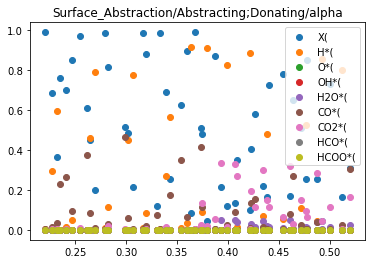

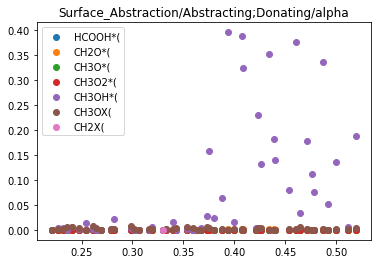

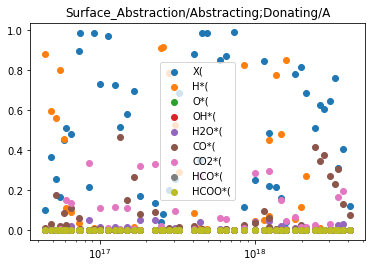

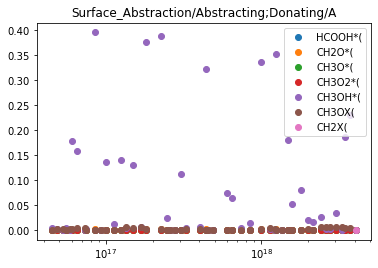

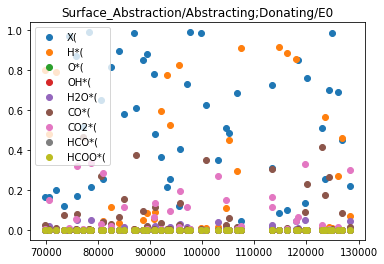

...

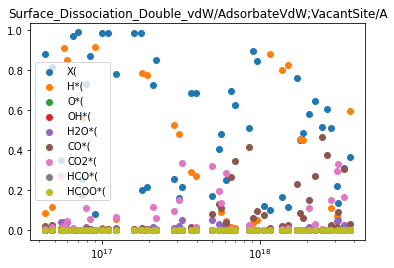

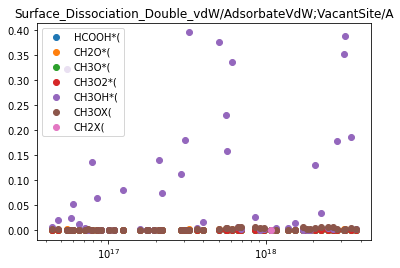

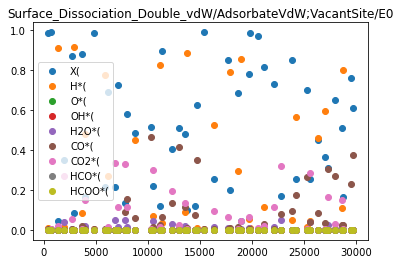

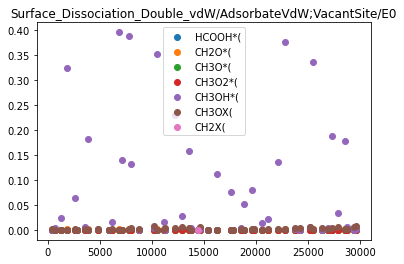

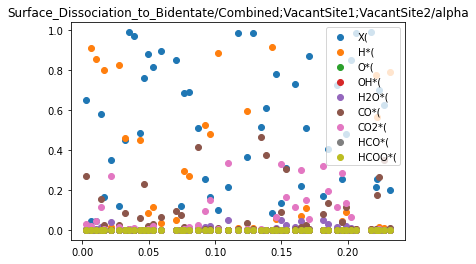

KeyboardInterrupt: 

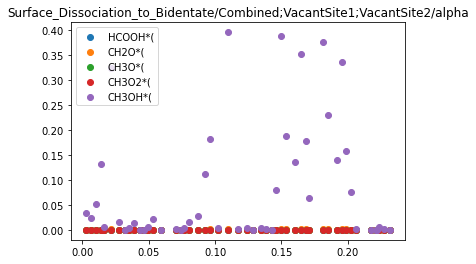

In [29]:
gas_list = [spec for spec in spec_list if "X" not in spec and "*" not in spec]
surf_list = [spec for spec in spec_list if "X" in spec or "*" in spec]

num_surf = len(surf_list)
mid_surf = round(num_surf/2)
for col in df:
    if col.endswith("/A"):
        log_sc = True
    else: 
        log_sc = False
    for spec in surf_list[:mid_surf]:
        if "X" in spec or "*" in spec: 
            
            x_list = []
            y_list = []
            for run, moles in output_moles_dict.items():
                if spec in moles.keys():
                    y_list.append(moles[spec])
                    x_list.append(df[col][run])
            plt.scatter(x_list,y_list, alpha=1.0, label=spec)
            if log_sc: 
                plt.xscale("log")
            plt.title(col)
            min_obj = min((abs(y), y) for y in y_list)[1] 
            min_index = y_list.index(min_obj)
            plt.legend()
    plt.show()

    for spec in surf_list[mid_surf+1:-1]:
        if "X" in spec or "*" in spec: 
            
            x_list = []
            y_list = []
            for run, moles in output_moles_dict.items():
                if spec in moles.keys():
                    y_list.append(moles[spec])
                    x_list.append(df[col][run])
            plt.scatter(x_list,y_list, alpha=1.0, label=spec)
            if log_sc: 
                plt.xscale("log")
            plt.title(col)
            min_obj = min((abs(y), y) for y in y_list)[1] 
            min_index = y_list.index(min_obj)
            plt.legend()
    plt.show()

In [9]:
gas_list = [spec for spec in spec_list if "X" not in spec and "*" not in spec]
surf_list = [spec for spec in spec_list if "X" in spec or "*" in spec]

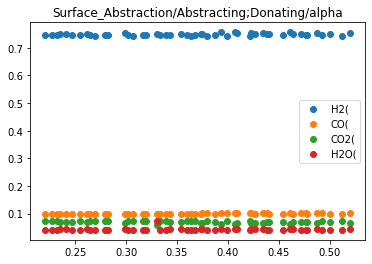

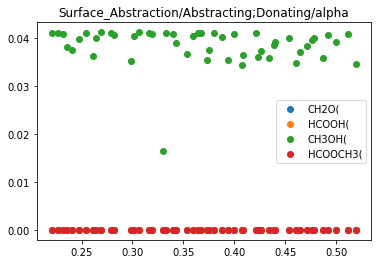

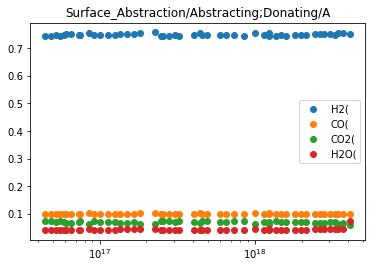

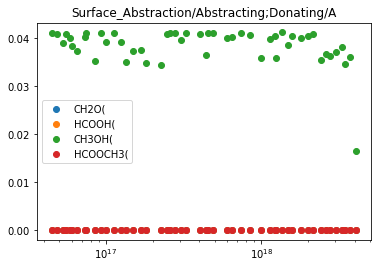

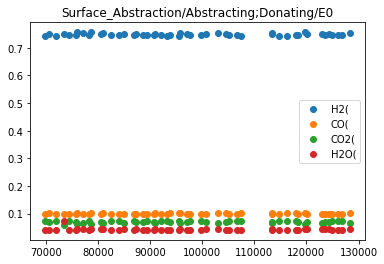

...

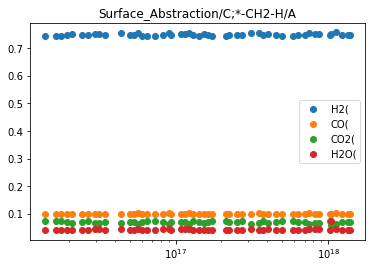

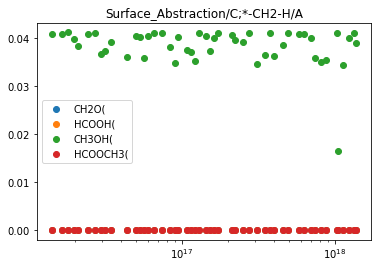

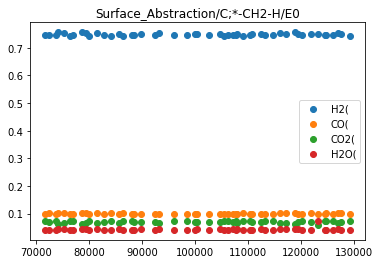

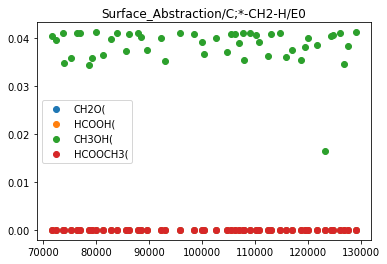

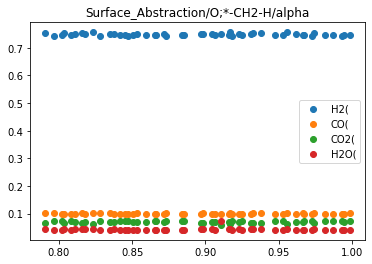

KeyboardInterrupt: 

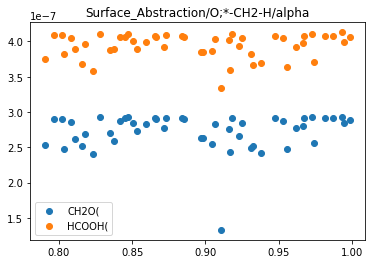

In [31]:
num_gas = len(gas_list)
mid_gas = round(num_gas/2)
for col in df:
    
    if col.endswith("/A"):
        log_sc = True
    else: 
        log_sc = False
    
    for spec in gas_list[:mid_gas]:
        if "X" not in spec and "*" not in spec: 

            x_list = []
            y_list = []
            for run, moles in output_moles_dict.items():
                if spec in moles.keys():
                    y_list.append(moles[spec])
                    x_list.append(df[col][run])
            plt.scatter(x_list,y_list, alpha=1.0, label=spec)
            
            if col.endswith("/A") and max(df[col]>1): 
                plt.xscale("log")
            plt.title(col)
            min_obj = min((abs(y), y) for y in y_list)[1] 
            min_index = y_list.index(min_obj)
            plt.legend()
    plt.show()
    
    for spec in gas_list[mid_gas:-1]:
        if "X" not in spec and "*" not in spec: 

            x_list = []
            y_list = []
            for run, moles in output_moles_dict.items():
                if spec in moles.keys():
                    y_list.append(moles[spec])
                    x_list.append(df[col][run])
            plt.scatter(x_list,y_list, alpha=1.0, label=spec)
            if col.endswith("/A") and max(df[col]>1): 
                plt.xscale("log")
            plt.title(col)
            min_obj = min((abs(y), y) for y in y_list)[1] 
            min_index = y_list.index(min_obj)
            plt.legend()
    plt.show()

In [ ]:
counter = 0
for col in df:
    counter += 1 
    obj_list = []
    val_list = []
    for run, obj in obj_func_dict.items():
        obj_list.append(obj)
#         obj_list.append(run)
        val_list.append(df[col][run])
#         val_list.append(obj)
        
    plt.scatter(val_list,obj_list, alpha=0.5)
    plt.title(col)
#     plt.yscale('log') 
    # get index of min obj function and make a vertical line
    min_obj = min((abs(x), x) for x in obj_list)[1] 
    min_index = obj_list.index(min_obj)
    plt.axvline(x=val_list[min_index], color = 'r')
    if col.endswith("/A") and max(val_list) > 1.0: 
        plt.xscale('log')
    plt.show()
#     if counter >=15:
#         break

## methanol TOF vs BEs

In [32]:
worst_max = max(obj_func_dict, key=obj_func_dict.get)

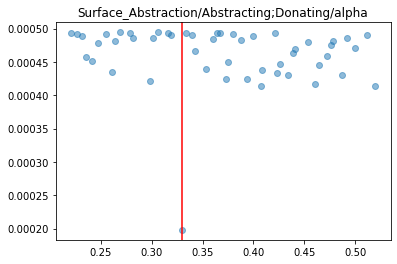

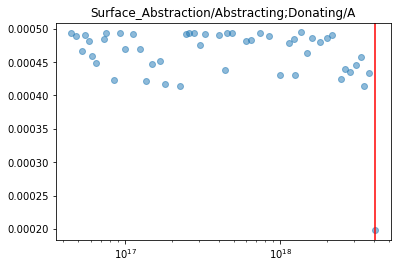

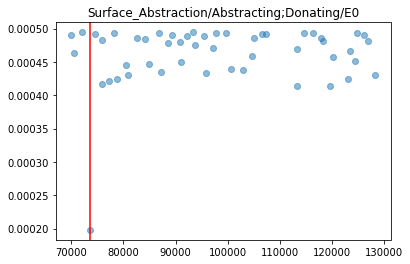

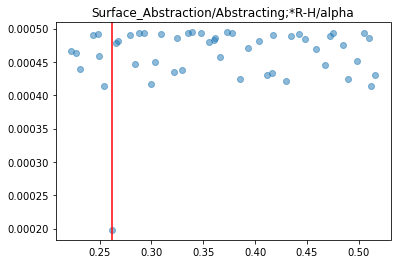

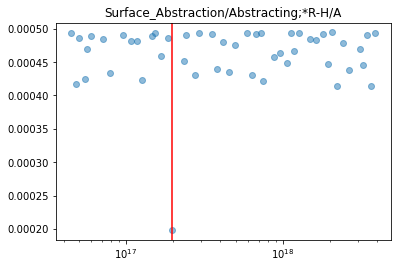

...

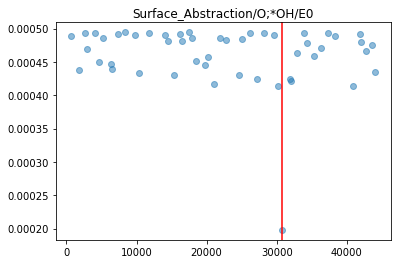

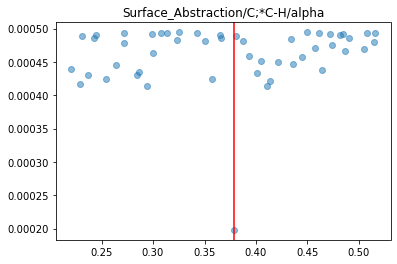

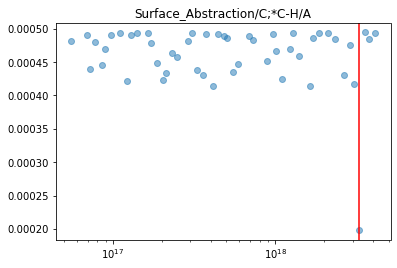

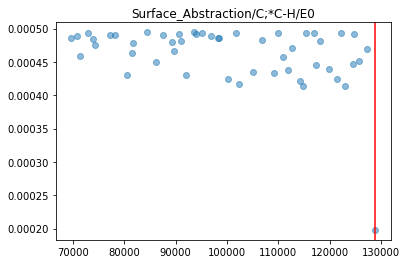

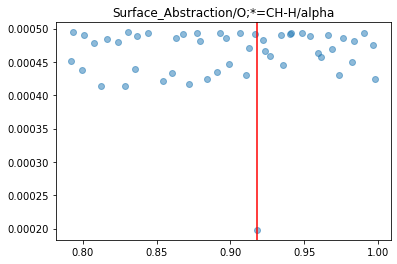

KeyboardInterrupt: 

In [34]:
counter = 0
for col in df:
    counter += 1 
    obj_list = []
    val_list = []
    for run, obj in meoh_tof_dict.items():
        obj_list.append(obj)
#         obj_list.append(run)
        val_list.append(df[col][run])
#         val_list.append(obj)
        
    plt.scatter(val_list,obj_list, alpha=0.5)
    plt.title(col)
#     plt.yscale('log') 
    # get index of min obj function and make a vertical line
    min_obj = min((abs(x), x) for x in obj_list)[1] 
    min_index = obj_list.index(min_obj)
    plt.axvline(x=val_list[min_index], color = 'r')
    if col.endswith("/A") and max(val_list) > 1.0: 
        plt.xscale('log')
    plt.show()
#     if counter >=15:
#         break

## H2O TOF vs BE

In [ ]:
counter = 0
for col in df:
    counter += 1 
    obj_list = []
    val_list = []
    for run, obj in h2o_tof_dict.items():
        obj_list.append(obj)
#         obj_list.append(run)
        val_list.append(df[col][run])
#         val_list.append(obj)
        
    plt.scatter(val_list,obj_list, alpha=0.5)
    plt.title(col)
#     plt.yscale('log') 
    # get index of min obj function and make a vertical line
    min_obj = min((abs(x), x) for x in obj_list)[1] 
    min_index = obj_list.index(min_obj)
    plt.axvline(x=val_list[min_index], color = 'r')
    if col.endswith("/A") and max(val_list) > 1.0: 
        plt.xscale('log')
    plt.show()
#     if counter >=15:
#         break

## Parity plot for closest run: 

In [72]:
    
for ctr, run in enumerate(obj_func_dict_sort.keys()):

    # run_num = str(closest).zfill(4)
    run_num = str(run).zfill(4)

    model_path =  os.path.join(output_path,f"run_{run_num}")
    csv_path = os.path.join(model_path, "cantera/ct_analysis.csv")
    if os.path.exists(csv_path) and obj_func_dict[run] > 0:
        data_graaf = pd.read_csv(csv_path)
        data_graaf = data_graaf[data_graaf["use_for_opt"] ==True]
        
        # data_graaf["RMG H2O TOF 1/s"] = data_graaf["RMG H2O TOF 1/s"].str.replace("[","").str.replace("]","").astype(float)
        # data_graaf["RMG MeOH TOF 1/s"] = data_graaf["RMG MeOH TOF 1/s"].str.replace("[","").str.replace("]","").astype(float)
        # ax = data_graaf.plot.scatter("graaf MeOH TOF 1/s","RMG MeOH TOF 1/s",loglog=True,color="b")
        ax = data_graaf.plot.scatter("graaf H2O TOF 1/s","RMG H2O TOF 1/s",loglog=False,color="b")
        data_graaf.plot.scatter("graaf MeOH TOF 1/s","RMG MeOH TOF 1/s",loglog=True,color="r", ax=ax)
        # ax = data_graaf.plot.scatter("graaf H2O TOF 1/s","RMG H2O TOF 1/s",color="b")
        # data_graaf.plot.scatter("graaf MeOH TOF 1/s","RMG MeOH TOF 1/s",color="r", ax=ax)
        ax.set_ylim(1e-8, 1e-1)
        ax.set_xlim(1e-8, 1e-1)

        ax.set_xlabel("Experimental TOF")
        ax.set_ylabel("Simulated TOF")
        # # ax.tick_params(axis='x', labelsize=14)
        # # ax.tick_params(axis='y', labelsize=14)
        ax.legend(labels=["H2O TOF","MeOH TOF"])

        # # make x=y line
        plt.gca().set_xlim(left=1e-4)
        plt.gca().set_ylim(bottom=1e-4)
        xpoints = plt.xlim()
        ypoints = plt.xlim()
        plt.plot(xpoints, ypoints, linestyle='--', color='k', lw=3,)
        plt.savefig(f"./animation/plot_{str(ctr).zfill(4)}.png")
    
    if ctr > 3:
        break
        


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [74]:
import imageio
images = []
filenames = glob.glob(os.path.join("./animation/", "*.png"))
filenames.reverse()
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('plot_movie.mp4', images, fps = 5)

ImportError: To use the imageio ffmpeg plugin you need to 'pip install imageio-ffmpeg'

In [ ]:
furthest = max(obj_func_dict, key=lambda y: abs(obj_func_dict[y]))
run_num = str(furthest).zfill(4)
# run_num = '0100'
model_path =  os.path.join(output_path,f"run_{run_num}")
csv_path = os.path.join(model_path, "cantera/ct_analysis.csv")

data_graaf = pd.read_csv(csv_path)
data_graaf = data_graaf[data_graaf["use_for_opt"] ==True]
# data_graaf["RMG H2O TOF 1/s"] = data_graaf["RMG H2O TOF 1/s"].str.replace("[","").str.replace("]","").astype(float)
# data_graaf["RMG MeOH TOF 1/s"] = data_graaf["RMG MeOH TOF 1/s"].str.replace("[","").str.replace("]","").astype(float)

# ax = data_graaf.plot.scatter("graaf MeOH TOF 1/s","RMG MeOH TOF 1/s",loglog=True,color="b")
ax = data_graaf.plot.scatter("graaf H2O TOF 1/s","RMG H2O TOF 1/s",loglog=False,color="b")
data_graaf.plot.scatter("graaf MeOH TOF 1/s","RMG MeOH TOF 1/s",loglog=False,color="r", ax=ax)
# ax = data_graaf.plot.scatter("graaf H2O TOF 1/s","RMG H2O TOF 1/s",color="b")
# data_graaf.plot.scatter("graaf MeOH TOF 1/s","RMG MeOH TOF 1/s",color="r", ax=ax)
# ax.set_ylim(1e-8, 1e-1)
# ax.set_xlim(1e-8, 1e-1)

# ax.set_xlabel("")
# ax.set_ylabel("")
# # ax.tick_params(axis='x', labelsize=14)
# # ax.tick_params(axis='y', labelsize=14)
# ax.legend(labels=["H2O TOF","MeOH TOF"])

# # make x=y line
plt.gca().set_xlim(left=-1e-4)
plt.gca().set_ylim(bottom=-1e-4)
xpoints = plt.xlim()
ypoints = plt.xlim()
plt.plot(xpoints, ypoints, linestyle='--', color='k', lw=3,)

# sanitize inputs
first, load in the perturbed values  
- the sobol map pickle has the value of the perturbed parameters. load this, then scale the a factors so we're looking at their exponent? 
- everything else should be okay I think? 

In [ ]:
sobol_path = f"{output_path}sobol_map.pickle"
with open(sobol_path, "rb") as input_file:
    perturb_values = pickle.load(input_file)

In [ ]:
# reconstruct dict so it is {key:list of values}
pert_val_san = {}
for param, values in perturb_values.items():
    # extract a list of just perturbed values, since we 
    # have a tuple with that and other metadata
    just_pert = values[1].tolist()
    
    # check for A factors that are not sticking coefficient
    # record the value at
    if min(just_pert) > 1.0 and param.endswith("/A"): 
        just_pert = [math.log(i,10) for i in just_pert]
    
    pert_val_san[param] = just_pert

# re-organize so we have a list of dicts, with the perturbed values as each individual dict? 
pert_val_san_list = []
for i in range(10000):
    ind_pert_dict = {}
    for key in pert_val_san.keys():
        ind_pert_dict[key] = pert_val_san[key][i]
    
    pert_val_san_list.append(ind_pert_dict)
    

Write the values to a space separated text file. from uqtk doc: 
- input is a Nxd matrix, each row is a d-variate parameter sample (so each column is a different perturbed value?)

In [ ]:
# # passed_runs
# perturb_values_copy = {}
# for run (param, val) in enumerate(perturb_values.items()):
#     if run in passed_runs:
#         perturb_values_copy
pert_val_san_list_passed = []
for run, data in enumerate(pert_val_san_list):
    if run in passed_runs:
        pert_val_san_list_passed.append(data)

len(pert_val_san_list_passed)

In [ ]:
csv_file = "Input_meoh.txt"
csv_columns = list(perturb_values.keys())
try:
    with open(csv_file, 'w') as csvfile:
        writer = csv.DictWriter(csvfile, delimiter=' ',fieldnames=csv_columns)
        # we will remove the header row, seems dicy because I do not know if the 
        # values are written correctly
        # writer.writeheader()
        for data in pert_val_san_list_passed:
            writer.writerow(data)

except IOError:
    print("I/O error")

 and that is the input data. now add the ranges

In [ ]:
sobol_range_path = f"{output_path}sobol_range_map.pickle"
with open(sobol_range_path, "rb") as input_file:
    perturb_range_values = pickle.load(input_file)

if all the same, grab the first item from each list to make a new dict

In [ ]:
# perturb_range_values_single = {}
# for key, value in perturb_range_values.items(): 
#     first_val_init = perturb_range_values[key][0]

#     if first_val_init[0] > 1.0 and key.endswith("/A"):
#         first_val = (math.log(first_val_init[0], 10), math.log(first_val_init[1], 10))
#     else:
#         first_val = first_val_init

#     perturb_range_values_single[key] = first_val
    
# perturb_range_values_single

In [ ]:
perturb_range_values['Surface_Abstraction/Abstracting;Donating/A']

In [ ]:
# # second and third value of sobol_range_map are min and max. 
# for key, value in perturb_range_values.items():
#     print("{0:f} {1:f} {2:f}\n".format(value[0], value[1], value[2]))

In [ ]:
# now just make a text file. 
range_file = "parameter_ranges_meoh.txt"
with open(range_file, "w") as f:
    for key, value in perturb_range_values.items():
        f.write("{0:f} {1:f}\n".format(value[1], value[2]))

# get parameter names

In [ ]:
pert_value_names = list(perturb_range_values.keys())

with open("parameter_names_meoh.txt", "w") as f:
    for name in pert_value_names:
        f.write(name+"\n")

# get output data and write to file

In [ ]:
ct_data_dict = {}

data_keys = [
    "RMG MeOH TOF 1/s",
    "RMG H2O TOF 1/s",
]

for file in ct_data_files:
    # find the string for the run number 
    pattern = re.compile('run_\d{4}')
    match = re.search('run_\d{4}',file)
    run_num = int(match.group(0).replace('run_', ""))
    df = pd.read_csv(file)
    data_run = df[(df['Unnamed: 0'] == 80)]
    data_dict = {}
    
    for key in data_keys: 
        output_value = float(data_run[key])
        if  output_value <=0: 
            output_value = 0
        else: 
            output_value = math.log(output_value, 10)
        data_dict[key] = output_value
        print(run_num,key,output_value,data_dict[key])
#     data_dict["run"] = run_num
    
    ct_data_dict[run_num]= data_dict
    
# sort by run
# ct_data_dict.sort(key=lambda y: y["run"])

In [ ]:
dict1 = {
    "a":1,"b":9,"c":6,"d":3,"e":8,"f":7,
}
dict2 = {
    "a":3,"b":12,"c":15,"d":17,"e":2,"f":1,
}
dict3 = {
    "a":4,"b":19,"c":73,"d":2,"e":2,"f":0,
}
dicty = []
dicty.append(dict1)
dicty.append(dict2)
dicty.append(dict3)
dicty.sort(key=lambda y: y["a"])
    

## more shuffling, I need to remove the runs that are less than = 0 meoh TOF

In [ ]:
pert_val_san_dict_passed = {}
for run, data in enumerate(pert_val_san_list):
    if run in passed_runs:
        pert_val_san_dict_passed[run] = data

In [ ]:
pert_val_san_dict_passed_copy = pert_val_san_dict_passed.copy()
ct_data_dict_copy = ct_data_dict.copy()
for run, data in ct_data_dict.items():
    
    for key, value in ct_data_dict_copy[run].items():
        print(key,value)
        if value == 0:
            del pert_val_san_dict_passed_copy[run]
            del ct_data_dict_copy[run]
            print(run)
            break

In [ ]:
len(ct_data_dict_copy)

In [ ]:
total = len(ct_data_dict_copy)
train = 5000
val = total -train 
print(train, val)

In [ ]:
# now just make a text file. 
output_file = "outputs_meoh.txt"
with open(output_file, "w") as f:
    for key, data_keys in ct_data_dict_copy.items():
        val_str_list = []
        for value in data_keys:
            val_str_list.append("{0:e}".format(data_keys[value]))
        value_str = " ".join(val_str_list)
        f.write(f"{value_str}\n")

In [ ]:
csv_file = "Input_meoh.txt"
csv_columns = list(perturb_values.keys())
try:
    with open(csv_file, 'w') as f:
        writer = csv.writer(f, delimiter=" ")
        # we will remove the header row, seems dicy because I do not know if the 
        # values are written correctly
        # writer.writeheader()
        for key,perts in pert_val_san_dict_passed_copy.items():
            data = []
            for value in perts.values():
                data.append(value)
            writer.writerow(data)

except IOError:
    print("I/O error")

In [ ]:
num_train = 6367
num_val = 2122


# with is like your try .. finally block in this case
with open('workflow_meoh.x', 'r') as f:
    # read a list of lines into data
    data = f.readlines()

for line, datum in enumerate(data): 
    if "TRAIN =" in datum:
        data[line] = f"TRAIN = {num_train}\n"
    if "VAL =" in datum:
        data[line] = f"VAL = {num_val}\n"      

# and write everything back
with open('workflow_meoh.x', 'w') as f:
    f.writelines(data)
        

In [ ]:
dicty = {
    "h":2,
    "i":2,
    "j":2,
    "k":2,
    "l":2,
}

len(dicty)

In [ ]:
import pandas as pd
import numpy as np
df = pd.read_csv('Input_meoh.txt', delimiter=' ', names=['C', 'O', 'H', 'N', 'vdw'])  

In [ ]:
df.drop('N', inplace=True, axis=1)
df.drop('O', inplace=True, axis=1)
df.drop('vdw', inplace=True, axis=1)
np.savetxt("Input_meoh_2.txt", df, delimiter=' ')

In [ ]:
# drop water column
df = pd.read_csv('outputs_meoh.txt', delimiter=' ', names=['meoh','h2o']) 
df['meoh'] = (df['meoh']/abs(df['meoh']))*np.log10(abs(df['meoh'])+1)
df['h2o'] = (df['h2o']/abs(df['h2o']))*np.log10(abs(df['h2o'])+1)
np.savetxt("outputs_meoh_2.txt", df, delimiter=' ')

In [ ]:
df = pd.read_csv('outputs_meoh.txt', delimiter=' ', names=['meoh','h2o']) 
df.drop('meoh', inplace=True, axis=1)
np.savetxt("outputs_meoh_2.txt", df, delimiter=' ')